In [1]:
# there are 2 new models: Webcocket & time which look no pip install required
import os
import alpaca_trade_api as tradeapi
# import 'ast' module to format the message we get from Alpaca to the way in which our bot will understand it
import ast
import time
import json
import pandas as pd
import numpy as np
import numpy.random as rnd
from dotenv import load_dotenv
import requests
from pathlib import Path
import hvplot.pandas
import sqlalchemy
# Import for NN deep learning
import pandas as pd
from pathlib import Path
import tensorflow as tf
import numpy
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,OneHotEncoder
from alpaca_trade_api import REST, TimeFrame
# Tablib stands for 'technical analysis library' used to analyse trading signals from candel charts to be extracted from alpaca api
# to install ta-lib, type in terminal "conda install -c conda-forge ta-lib" 
import talib as ta
# Websocket will be used to connect with alpaca to extract real time stock price (candel stick chart)
# to install websocket: pip install websocket-client
import websocket
# "Plotly" provides online graphing, analytics, and statistics tools for individuals and collaboration,
# in order for plotly to show graph in jupyter lab, need to run in termimal: "jupyter labextension install jupyterlab-plotly"
# to run above command, you may also need to install nodeJS 12.0 + by use install command: "conda install nodejs -c conda-forge --repodata-fn=repodata.json"

import plotly.graph_objects as go
import plotly.express as px
from datetime import datetime, timedelta
from matplotlib import pyplot as plt
    

today is 2022-06-30
weeks_to_go_back_for_backtesting is 0
earlier_date_to_compare is 2022-06-23
start_date_historical is 2022-06-23
end_date_historical is 2022-06-30
image_name is backtesting from 2022-06-23 to 2022-06-30
path_to_save_image is ./Resources/backtesting from 2022-06-23 to 2022-06-30
image_name_contrarian is backtesting from 2022-06-23 to 2022-06-30 contrarian
path_to_save_image is ./Resources/backtesting from 2022-06-23 to 2022-06-30 contrarian
image_name_accuracy is backtesting from 2022-06-23 to 2022-06-30 accuracy
path_to_save_image_accuracy is ./Resources/backtesting from 2022-06-23 to 2022-06-30 accuracy
              precision    recall  f1-score   support

        -1.0       0.56      0.64      0.60       463
         1.0       0.58      0.50      0.54       463

    accuracy                           0.57       926
   macro avg       0.57      0.57      0.57       926
weighted avg       0.57      0.57      0.57       926

today is 2022-06-30
weeks_to_go_back_for_b

/opt/homebrew/Caskroom/miniforge/base/envs/tensorflow/lib/python3.9/site-packages/pandas/plotting/_matplotlib/core.py:386: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


today is 2022-06-30
weeks_to_go_back_for_backtesting is 7
earlier_date_to_compare is 2022-06-23
start_date_historical is 2022-05-05
end_date_historical is 2022-05-12
image_name is backtesting from 2022-05-05 to 2022-05-12
path_to_save_image is ./Resources/backtesting from 2022-05-05 to 2022-05-12
image_name_contrarian is backtesting from 2022-05-05 to 2022-05-12 contrarian
path_to_save_image is ./Resources/backtesting from 2022-05-05 to 2022-05-12 contrarian
image_name_accuracy is backtesting from 2022-05-05 to 2022-05-12 accuracy
path_to_save_image_accuracy is ./Resources/backtesting from 2022-05-05 to 2022-05-12 accuracy
              precision    recall  f1-score   support

        -1.0       0.56      0.60      0.58       437
         1.0       0.57      0.52      0.54       437

    accuracy                           0.56       874
   macro avg       0.56      0.56      0.56       874
weighted avg       0.56      0.56      0.56       874

today is 2022-06-30
weeks_to_go_back_for_b

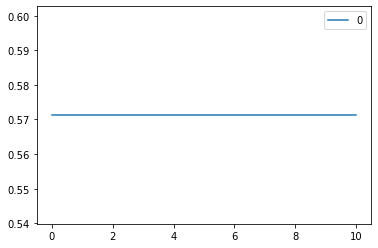

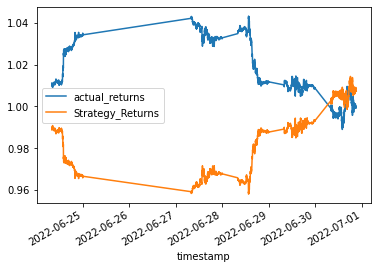

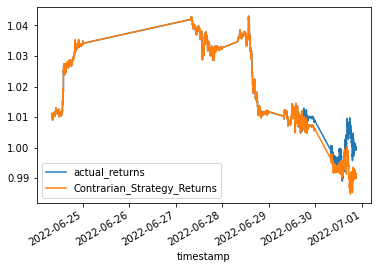

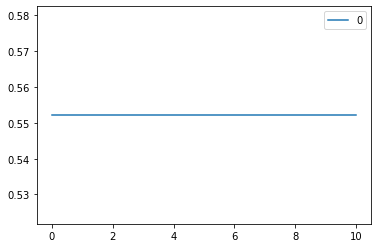

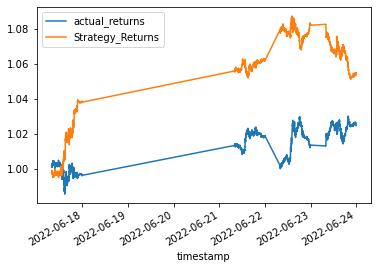

...

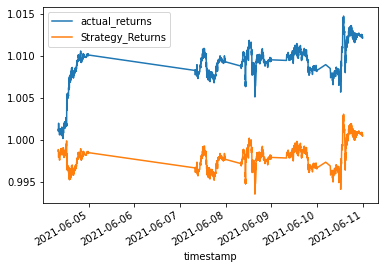

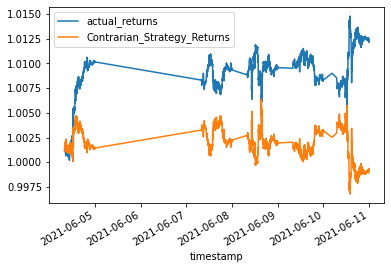

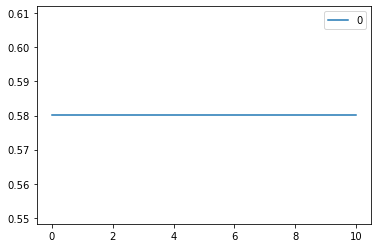

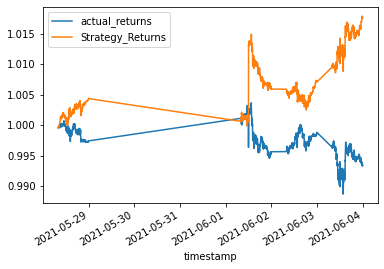

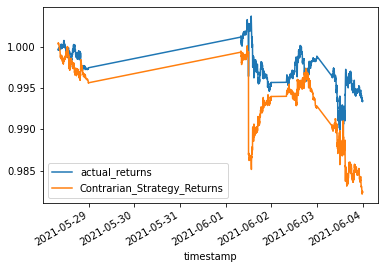

In [2]:
for i in range(57):
    # use timedelta from Datetime to generate earlier date so we can extract historical data from alpaca later
    days_to_subtract = 7
    weeks_to_go_back_for_backtesting = i
    today = (datetime.today()).strftime('%Y-%m-%d')
    print(f'today is {today}')
    print(f'weeks_to_go_back_for_backtesting is {weeks_to_go_back_for_backtesting}')


    earlier_date_to_compare = (datetime.today()-timedelta(days=days_to_subtract)).strftime('%Y-%m-%d')
    print(f'earlier_date_to_compare is {earlier_date_to_compare}')
    # define bunch of variables that can be easiy changed to fine turn the algo
    stock = 'SPY'
    shift_time = 1
    # start_date_historical = earlier_date_to_compare 
    # end_date_historical = today

    start_date_historical = (datetime.today()-timedelta(days=days_to_subtract+7*weeks_to_go_back_for_backtesting)).strftime('%Y-%m-%d') 
    end_date_historical = (datetime.today()-timedelta(days=7*weeks_to_go_back_for_backtesting)).strftime('%Y-%m-%d')

    print(f'start_date_historical is {start_date_historical}')
    print(f'end_date_historical is {end_date_historical}')

    image_name = 'backtesting '+ 'from ' + start_date_historical + ' to ' + end_date_historical
    print(f'image_name is {image_name}')
    path_to_save_image = './Resources/'+image_name
    print(f'path_to_save_image is {path_to_save_image}')

    image_name_contrarian = 'backtesting '+ 'from ' + start_date_historical + ' to ' + end_date_historical + ' contrarian'
    print(f'image_name_contrarian is {image_name_contrarian}')
    path_to_save_image_contrarian = './Resources/'+image_name_contrarian
    print(f'path_to_save_image is {path_to_save_image_contrarian}')

    image_name_accuracy = 'backtesting '+ 'from ' + start_date_historical + ' to ' + end_date_historical + ' accuracy'
    print(f'image_name_accuracy is {image_name_accuracy}')
    path_to_save_image_accuracy = './Resources/'+image_name_accuracy
    print(f'path_to_save_image_accuracy is {path_to_save_image_accuracy}')

    # periods_for_training_data = 800
    periods_for_training_data = 1000
    sma_short_window =20
    sma_long_window=50
    RSI_time_period = 3
    EMA_time_period = 50

    csv_output_file_name = './Resources/'+ stock + '_min_historical.csv'
    csv_output_file_name
    # set up paramers in order to connect to alpaca API
    load_dotenv()
    alpaca_api_key = os.getenv('ALPACA_API_KEY')
    alpaca_secret_key = os.getenv('ALPACA_SECRET_KEY')
    # Define alpaca api object 
    api = tradeapi.REST(alpaca_api_key, alpaca_secret_key, "https://paper-api.alpaca.markets", "v2")
    # Retrieve stock OHLC price info from Alpaca api and install in dataframe 'bars'
    rest_client = REST(alpaca_api_key, alpaca_secret_key)
    bars = rest_client.get_bars("SPY", TimeFrame.Minute, start_date_historical, end_date_historical).df
    bars
    bars.to_csv(Path(csv_output_file_name))
    bars["close"].hvplot(title=stock)
    bars["actual_returns"] = bars["close"].pct_change()
    # Drop all NaN values from the DataFrame
    bars = bars.dropna()
    # use talib to calcualte SMA (Simple moving avera
    bars['sma_short_window'] = ta.SMA(bars['close'],timeperiod=sma_short_window)
    bars['sma_long_window'] = ta.SMA(bars['close'],timeperiod=sma_long_window)

    bars['RSI'] = ta.RSI(bars['close'],timeperiod=RSI_time_period)
    bars['EMA'] = ta.RSI(bars['close'],timeperiod=EMA_time_period)
    bars = bars.dropna()
    # Assign a copy of the technical variable columns to a new DataFrame called `X` and lag it.
    X = bars[['sma_short_window', 'sma_long_window', 'RSI', 'EMA', ]].shift(shift_time).dropna().copy()
    bars['signal'] = 0.0
    # Generate signal to buy stock long
    bars.loc[(bars['actual_returns'] >= 0), 'signal'] = 1
    # Generate signal to sell stock short
    bars.loc[(bars['actual_returns'] < 0), 'signal'] = -1
    bars['contrarian_signal']= bars['signal']*(-1)
    # Calculate the strategy returns and add them to the signals_df DataFrame
    # add shift after signal is because the buying/selling will be one day delay after the reutrn
    bars['Strategy_Returns'] = bars['actual_returns'] * bars['signal'].shift(shift_time)
    bars['contrarian_Strategy_Returns'] = bars['actual_returns'] * bars['contrarian_signal'].shift(shift_time)

    # Review the DataFrame
    bars.to_csv(Path('./Resources/Bar_df.csv'))
    # Copy the new "signal" column to a new Series called `y`.
    y = bars['signal']
    # Import the neccessary Date function
    from pandas.tseries.offsets import DateOffset
    # Use the following code to select the start of the training period: `training_begin = X.index.min()`
    training_begin = X.index.min()
    training_end = X.index.min() + DateOffset(minutes=periods_for_training_data)
    # Generate the X_train and y_train DataFrames using loc to select the rows from `training_begin` up to `training_end`
    # Hint: Use `loc[training_begin:training_end]` for X_train and y_train
    # Note, that the actually traning data might be less than expected beucase there is no data for the weekend or between midnight and 8am
    X_train = X.loc[training_begin:training_end]
    y_train = y.loc[training_begin:training_end]
    # Generate the X_test and y_test DataFrames using loc to select from `training_end` to the last row in the DataFrame.
    # Hint: Use `loc[training_end:]` for X_test and y_test
    X_test = X.loc[training_end:]
    y_test = y.loc[training_end:]
    # Use StandardScaler to scale the X_train and X_test data.
    from sklearn.preprocessing import StandardScaler
    scaler = StandardScaler()
    X_scaler = scaler.fit(X_train)
    X_train_scaled = X_scaler.transform(X_train)
    X_test_scaled = X_scaler.transform(X_test)

    #display(X_train_scaled)

    from imblearn.over_sampling import RandomOverSampler
    # Use RandomOverSampler to resample the datase using random_state=1
    ros = RandomOverSampler(random_state=1)
    X_resampled, y_resampled = ros.fit_resample(X_train_scaled, y_train)
    X_resampled

    # Create the classifier model.
    from sklearn.svm import SVC
    model = SVC()

    # Fit the model to the data using X_train_scaled and y_train
    model = model.fit(X_resampled, y_resampled)
    # Use the trained model to predict the trading signals for the training data.
    training_signal_predictions = model.predict(X_resampled)


    # Evaluate the model using a classification report
    from sklearn.metrics import classification_report
    training_report = classification_report(y_resampled, training_signal_predictions)
    print(training_report)
    training_report = classification_report(y_resampled, training_signal_predictions,output_dict=True)
    training_report
    # display(training_signal_predictions)
    accuracy = training_report['accuracy']
    #display(accuracy)
    xpoints = np.array([accuracy,accuracy])
    ypoints = np.array([0, 10])
    accuracy_df = pd.DataFrame(xpoints,ypoints)

    accuracy_df.plot()

    plt.savefig(path_to_save_image_accuracy)
    # Use the trained model to predict the trading signals for the training data.
    training_signal_predictions = model.predict(X_test_scaled)

    contrarian_training_signal_predictions = training_signal_predictions * (-1)

    #display(training_signal_predictions)

    #display(contrarian_training_signal_predictions)
    # Create a new empty predictions DataFrame.

    # Create a predictions DataFrame
    predictions_df = pd.DataFrame(index=X_test.index)

    # Add the SVM model predictions to the DataFrame
    predictions_df['Predicted'] = training_signal_predictions

    predictions_df['Contrarian_Predicted'] = contrarian_training_signal_predictions


    # Add the actual returns to the DataFrame
    predictions_df['close'] = bars['close'] 
    predictions_df['signal'] = bars['signal'] 
    predictions_df['actual_returns'] = bars['actual_returns'] 

    # Add the strategy returns to the DataFrame
    predictions_df['Strategy_Returns'] = (
        predictions_df["actual_returns"] * predictions_df["Predicted"]
    )

    predictions_df['Strategy_Returns'] = (
        predictions_df["actual_returns"] * predictions_df["Predicted"]
    )

    predictions_df['Contrarian_Strategy_Returns'] = (
        predictions_df["actual_returns"] * predictions_df["Contrarian_Predicted"]
    )



    # Review the DataFrame

    predictions_df.to_csv(Path('./Resources/prediction_df.csv'))
    # Plot the actual returns versus the strategy returns
    # YOUR CODE HERE
    (1 + predictions_df[["actual_returns", "Strategy_Returns"]]).cumprod().plot()
    plt.savefig(path_to_save_image)
    (1 + predictions_df[["actual_returns", "Contrarian_Strategy_Returns"]]).cumprod().plot()
    plt.savefig(path_to_save_image_contrarian)

